# 1. 读取dedx文件

In [1]:
//读取dedx文件
void readfile(string filename, Int_t A,TGraph *g)
{
ifstream in(filename);
string ss;
double a, b, e, dedx;
//g = new TGraph;

if(!in.is_open())
{
    cout<<filename<<" does noet exist!"<<endl;
    return 0;
}
getline(in,ss);
int i=0;
while(!in.eof())
{
    in>>a>>b>>e>>dedx>>a>>b>>a>>b>>a>>b>>a>>b;//e:MeV/u,dedx:MeV/m;
   
    if(!in.eof())
    {
         g->SetPoint(i,e*A,dedx*1000);//number,MeV,MeV/mm
    }
    i++;
}
in.close();   
}

In [2]:
//%jsroot on
//check readfile
/*
TCanvas c_he4;
TGraph *g_he4= new TGraph;

readfile("He4elossinSi.txt",4,g_he4);
g_he4->SetTitle("dE/dx (Mev/mm) vs. MeV/u for He4 in Silicon");
g_he4->SetLineColor(kGreen);
g_he4->Draw();
gPad->SetLogy();
gPad->SetLogx();
c_he4.Draw();
*/

# 2. 入射粒子的射程

In [3]:
void energyvsdepth(TGraph *g, TGraph *depth2energy,TGraph *energy2depth)
{
Double_t er = 1000.;//MeV：1000 MeV 粒子；
Double_t dx = 0.001;//mm：穿透每个切片的厚度；
Double_t x=0.0;//mm：穿透总厚度

Int_t j =0;
while(er>0)
    {
    depth2energy->SetPoint(j,x,er);//写入穿透该切片前位置与dedx
    energy2depth->SetPoint(j,er,x);
    j++;//下一切片；
    x=j*dx;//穿透该切片后位置；
    er=er-dx*g->Eval(er);//穿透切片后剩余能量；
    }
    depth2energy->SetPoint(j,x,0);//写入粒子能量全部沉积后的位置与er；
    energy2depth->SetPoint(j,0,x);//写入粒子能量全部沉积后的位置与er；
}


In [4]:
//%jsroot on
//check
/*
TCanvas c_he4;
TGraph *g_he4,*d2e_he4,*e2d_he4;
g_he4 = new TGraph;
readfile("He4elossinSi.txt",4,g_he4);
d2e_he4= new TGraph;
e2d_he4= new TGraph;
energyvsdepth(g_he4,d2e_he4,e2d_he4);
d2e_he4->Draw();
//e2d_he4->Draw();
cout<<"the depth of 4He with 1000 MeV is "<<e2d_he4->Eval(0)<<"mm in Silicon"<<endl;
c_he4.Draw();
*/

In [5]:
Double_t range(Double_t e)
{
TCanvas c_he4;
TGraph *g_he4,*d2e_he4,*e2d_he4;
g_he4 = new TGraph;
readfile("He4elossinSi.txt",4,g_he4);
d2e_he4= new TGraph;
e2d_he4= new TGraph;
energyvsdepth(g_he4,d2e_he4,e2d_he4); 
return e2d_he4->Eval(0)-e2d_he4->Eval(e);
}

In [6]:
Double_t e[4]={5.486,10.,100.,200.};//MeV 
for(int i=0;i<4;i++)
{
cout<<"the range of "<<e[i]<<"MeV 4He in Silicon is "<<range(e[i])<<" mm"<<endl;
}

the range of 5.486MeV 4He in Silicon is 0.0277423 mm
the range of 10MeV 4He in Silicon is 0.0692679 mm
the range of 100MeV 4He in Silicon is 3.48517 mm
the range of 200MeV 4He in Silicon is 12.0104 mm


# 3. 入射粒子在探测器中的能损

以10 MeV，100 MeV，1000 MeV的4He粒子先后穿过厚度为1000 um，500 um，1000 um的能量损失；

In [7]:
Double_t eloss(Double_t e,Double_t thickness,TGraph *depth2energy,TGraph *energy2depth)
{
Double_t x_depth;
Double_t de;
x_depth=energy2depth->Eval(e);
x_depth=x_depth+thickness;
de=e-depth2energy->Eval(x_depth);
 if(de<e) 
    {
    de=de;  
    }
     else
    {
    de=e;
    }
return de;
}

In [8]:
TCanvas c_he4;
TGraph *g_he4,*d2e_he4,*e2d_he4;
g_he4 = new TGraph;
readfile("He4elossinSi.txt",4,g_he4);
d2e_he4= new TGraph;
e2d_he4= new TGraph;
energyvsdepth(g_he4,d2e_he4,e2d_he4); 
Double_t e1[3]={10.,100.,200.};//MeV
Double_t thickness[3]={1.,0.5,1.};//mm
for(int i=0;i<3;i++)
{
    for(int j=0;j<3;j++)
    {
    cout<<"the eloss of 4He with "<<e1[i]<<" MeV in "<<thickness[j]*1000<<" um Silicon is "<<eloss(e1[i],thickness[j],d2e_he4,e2d_he4)<<" MeV;"<<endl;
    e1[i]=e1[i]-eloss(e1[i],thickness[j],d2e_he4,e2d_he4);
    }
    cout<<" "<<endl;
}

the eloss of 4He with 10 MeV in 1000 um Silicon is 10 MeV;
the eloss of 4He with 0 MeV in 500 um Silicon is 0 MeV;
the eloss of 4He with 0 MeV in 1000 um Silicon is 0 MeV;
 
the eloss of 4He with 100 MeV in 1000 um Silicon is 17.3812 MeV;
the eloss of 4He with 82.6188 MeV in 500 um Silicon is 9.8863 MeV;
the eloss of 4He with 72.7325 MeV in 1000 um Silicon is 24.0471 MeV;
 
the eloss of 4He with 200 MeV in 1000 um Silicon is 9.48408 MeV;
the eloss of 4He with 190.516 MeV in 500 um Silicon is 4.88291 MeV;
the eloss of 4He with 185.633 MeV in 1000 um Silicon is 10.0875 MeV;
 


# 4. He同位素望远镜粒子鉴别图

In [9]:
void PID(string filename, Int_t A,TGraph*d1d2,TGraph*d2d3)
{
TGraph *g_dedx=new TGraph;
readfile(filename,A,g_dedx);
TGraph *d2e= new TGraph;
TGraph *e2d= new TGraph;
energyvsdepth(g_dedx,d2e,e2d); 
    
TRandom3 *e_random =new TRandom3(0);
Double_t thickness[3]={1.,0.5,1.};//mm
Double_t energy;//MeV
Double_t de[3];//eloss in silicon with different thickness;

for(Int_t ientries=0;ientries<10000;ientries++)
    {
    energy=A*e_random->Uniform(0.,35.);
    for(int j=0;j<3;j++)
        {
        de[j]=eloss(energy,thickness[j],d2e,e2d);
        energy=energy-eloss(energy,thickness[j],d2e,e2d);
        }
    d1d2->SetPoint(ientries,de[1],de[0]);
    d2d3->SetPoint(ientries,de[2],de[1]);
    }
}

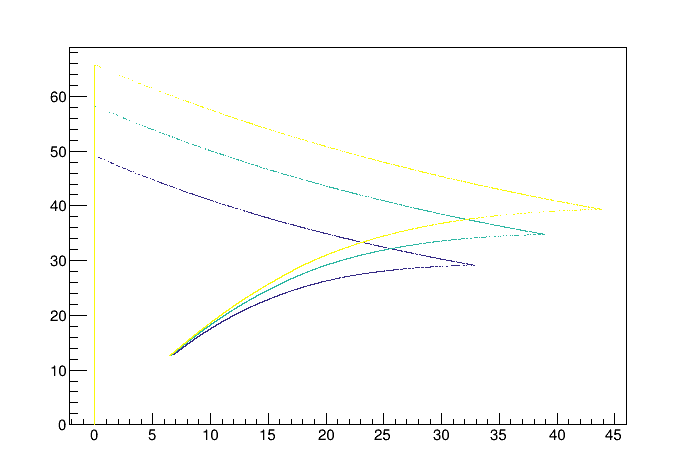

In [10]:
//%jsroot on
TCanvas c1;
TGraph * d1e_d2e[3];
TGraph * d2e_d3e[3];
d1e_d2e[0]= new TGraph;
d1e_d2e[1]= new TGraph;
d1e_d2e[2]= new TGraph;
d2e_d3e[0]= new TGraph;
d2e_d3e[1]= new TGraph;
d2e_d3e[2]= new TGraph;
PID("He4elossinSi.txt",4,d1e_d2e[0],d2e_d3e[0]);
PID("He6elossinSi.txt",6,d1e_d2e[1],d2e_d3e[1]);
PID("He8elossinSi.txt",8,d1e_d2e[2],d2e_d3e[2]);
auto *d1d2_t= new TMultiGraph;
d1d2_t->Add(d1e_d2e[0]);
d1d2_t->Add(d1e_d2e[1]);
d1d2_t->Add(d1e_d2e[2]);
d1d2_t->Draw("AP PMC");
c1.Draw();

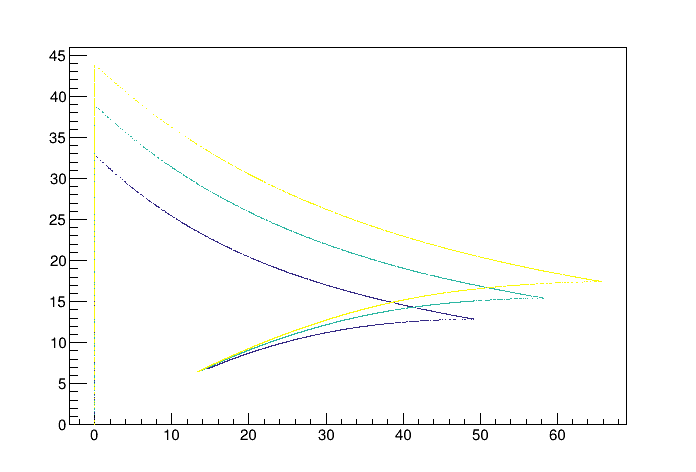

In [11]:
//%jsroot on
TCanvas c2;
auto *d2d3_t= new TMultiGraph;
d2d3_t->Add(d2e_d3e[0]);
d2d3_t->Add(d2e_d3e[1]);
d2d3_t->Add(d2e_d3e[2]);
d2d3_t->Draw("AP PMC");
c2.Draw();

# 5. 同为素H，He，Li，Be，B，C，N，O的PID（0～35 MeV/u）

In [12]:
%jsroot on
TCanvas c3;
TGraph *de1de2[38];
TGraph *de2de3[38];
for(Int_t i=0;i<38;i++)
{
    de1de2[i]=new TGraph;
    de2de3[i]=new TGraph;
}
Int_t i_t=0;
Int_t j_t=0;
PID("H1elossinSi.txt",1,de1de2[i_t++],de2de3[j_t++]);
PID("H1elossinSi.txt",2,de1de2[i_t++],de2de3[j_t++]);
PID("H1elossinSi.txt",3,de1de2[i_t++],de2de3[j_t++]);
PID("He4elossinSi.txt",3,de1de2[i_t++],de2de3[j_t++]);
PID("He4elossinSi.txt",4,de1de2[i_t++],de2de3[j_t++]);
PID("He6elossinSi.txt",6,de1de2[i_t++],de2de3[j_t++]);
PID("Li6elossinSi.txt",6,de1de2[i_t++],de2de3[j_t++]);
PID("Li6elossinSi.txt",7,de1de2[i_t++],de2de3[j_t++]);
PID("Li6elossinSi.txt",8,de1de2[i_t++],de2de3[j_t++]);
PID("Li6elossinSi.txt",9,de1de2[i_t++],de2de3[j_t++]);
PID("Be9elossinSi.txt",7,de1de2[i_t++],de2de3[j_t++]);
PID("Be9elossinSi.txt",9,de1de2[i_t++],de2de3[j_t++]);
PID("Be9elossinSi.txt",10,de1de2[i_t++],de2de3[j_t++]);
PID("Be9elossinSi.txt",11,de1de2[i_t++],de2de3[j_t++]);
PID("B10elossinSi.txt",8,de1de2[i_t++],de2de3[j_t++]);
PID("B10elossinSi.txt",10,de1de2[i_t++],de2de3[j_t++]);
PID("B10elossinSi.txt",11,de1de2[i_t++],de2de3[j_t++]);
PID("B10elossinSi.txt",12,de1de2[i_t++],de2de3[j_t++]);
PID("B10elossinSi.txt",13,de1de2[i_t++],de2de3[j_t++]);
PID("C12elossinSi.txt",10,de1de2[i_t++],de2de3[j_t++]);
PID("C12elossinSi.txt",11,de1de2[i_t++],de2de3[j_t++]);
PID("C12elossinSi.txt",12,de1de2[i_t++],de2de3[j_t++]);
PID("C12elossinSi.txt",13,de1de2[i_t++],de2de3[j_t++]);
PID("C12elossinSi.txt",14,de1de2[i_t++],de2de3[j_t++]);
PID("C12elossinSi.txt",15,de1de2[i_t++],de2de3[j_t++]);
PID("N14elossinSi.txt",12,de1de2[i_t++],de2de3[j_t++]);
PID("N14elossinSi.txt",13,de1de2[i_t++],de2de3[j_t++]);
PID("N14elossinSi.txt",14,de1de2[i_t++],de2de3[j_t++]);
PID("N14elossinSi.txt",15,de1de2[i_t++],de2de3[j_t++]);
PID("N14elossinSi.txt",16,de1de2[i_t++],de2de3[j_t++]);
PID("N14elossinSi.txt",17,de1de2[i_t++],de2de3[j_t++]);
PID("O16elossinSi.txt",14,de1de2[i_t++],de2de3[j_t++]);
PID("O16elossinSi.txt",15,de1de2[i_t++],de2de3[j_t++]);
PID("O16elossinSi.txt",16,de1de2[i_t++],de2de3[j_t++]);
PID("O16elossinSi.txt",17,de1de2[i_t++],de2de3[j_t++]);
PID("O16elossinSi.txt",18,de1de2[i_t++],de2de3[j_t++]);
PID("O16elossinSi.txt",19,de1de2[i_t++],de2de3[j_t++]);
PID("O16elossinSi.txt",20,de1de2[i_t++],de2de3[j_t++]);
auto *de1de2_t= new TMultiGraph;
for(Int_t i=0;i<38;i++)
{
de1de2_t->Add(de1de2[i]);
}
de1de2_t->SetTitle("de1:de2");
de1de2_t->GetXaxis()->SetTitle("de2 (MeV)");
de1de2_t->GetYaxis()->SetTitle("de1 (MeV)");
de1de2_t->Draw("AP PMC");
c3.Draw();

In [13]:
%jsroot on
TCanvas c4;
auto *de2de3_t= new TMultiGraph;
for(Int_t i=0;i<38;i++)
{
de2de3_t->Add(de2de3[i]);
}
de2de3_t->SetTitle("de2:de3");
de2de3_t->GetXaxis()->SetTitle("de3 (MeV)");
de2de3_t->GetYaxis()->SetTitle("de2 (MeV)");
de2de3_t->Draw("AP PMC");
c4.Draw();

In [15]:
!jupyter nbconvert 5.PID-function.ipynb --to html

[NbConvertApp] Converting notebook 5.PID-function.ipynb to html


